In [19]:
import pylab
import wave
from settings import *
import os
import matplotlib.pyplot as plt
from settings import *

In [22]:
def graph_spectrogram(wav_file):
    sound_info, frame_rate = get_wav_info(wav_file)
    pylab.specgram(sound_info, Fs=frame_rate)
    try:
        os.makedirs(SPECTROGRAM_FOLDER + wav_file[21])
    except:
        pass
    pylab.savefig(SPECTROGRAM_FOLDER + wav_file[21] + "/" + wav_file[18:20] + ".png")
    pylab.figure(num=None, figsize=(19, 12))
    pylab.subplot(111)
    pylab.title('spectrogram of %r' % wav_file)

def get_wav_info(wav_file):
    wav = wave.open(wav_file, 'r')
    frames = wav.readframes(-1)
    sound_info = pylab.fromstring(frames, 'int16')
    frame_rate = wav.getframerate()
    wav.close()
    return sound_info, frame_rate

def plot_spectrogram(number):
    folder_path = "./spectrogram/" + str(number) + "/"

    # Get the list of PNG files in the folder
    png_files = [file for file in os.listdir(folder_path) if file.endswith(".png")]

    # Create a figure with 2 rows and 3 columns for the subplots
    fig, axs = plt.subplots(2, 3, figsize=(19, 8))

    # Iterate over the PNG files and display them in the subplots
    for i, png_file in enumerate(png_files):
        # Calculate the row and column index for the current subplot
        row = i // 3
        col = i % 3
        
        # Load the PNG image and display it in the corresponding subplot
        img = plt.imread(os.path.join(folder_path, png_file))
        axs[row, col].imshow(img)
        axs[row, col].axis('off')
        axs[row, col].set_title(png_file[:-4])

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Display the figure
    plt.show()

C:\Users\Viet Tung\AppData\Local\Temp\ipykernel_5792\3532139726.py:15: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  sound_info = pylab.fromstring(frames, 'int16')
C:\Users\Viet Tung\AppData\Local\Temp\ipykernel_5792\3532139726.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  pylab.figure(num=None, figsize=(19, 12))


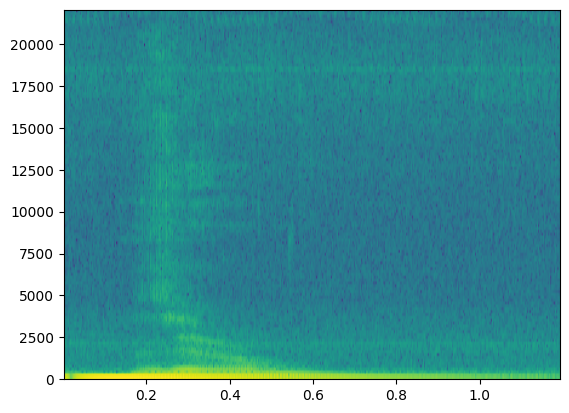

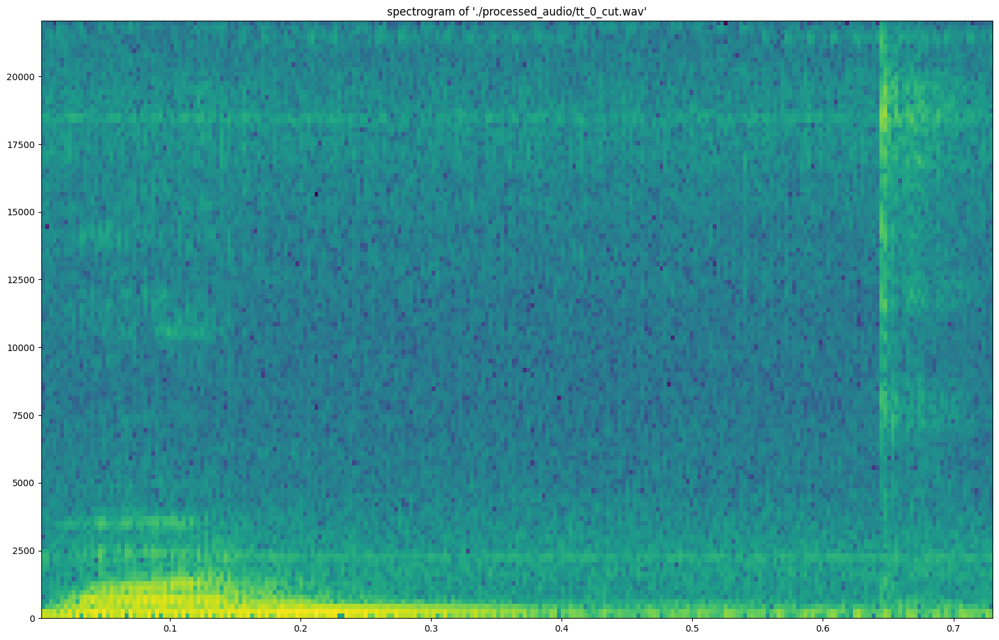

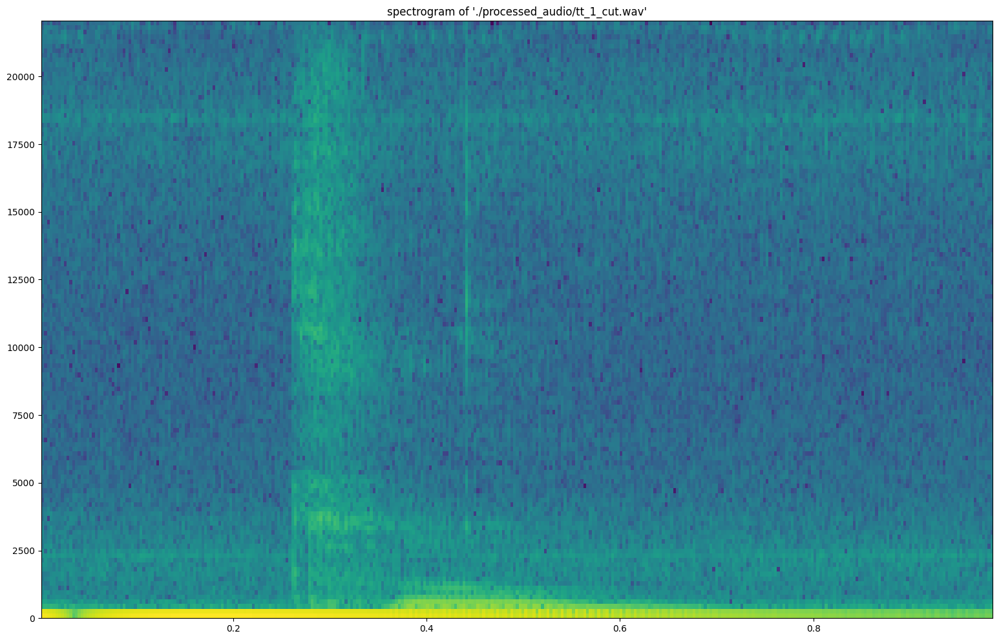

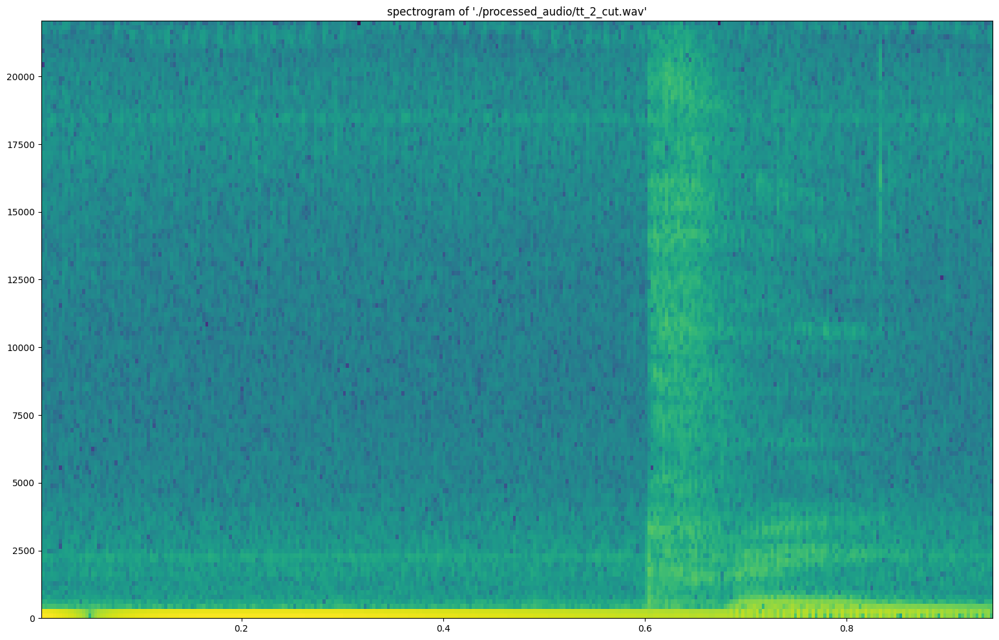

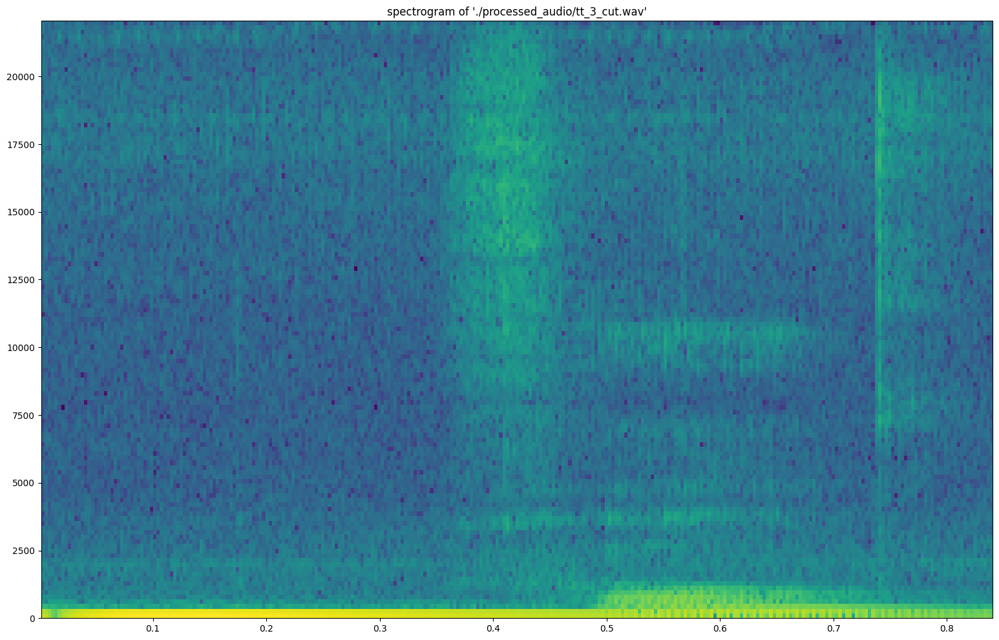

...

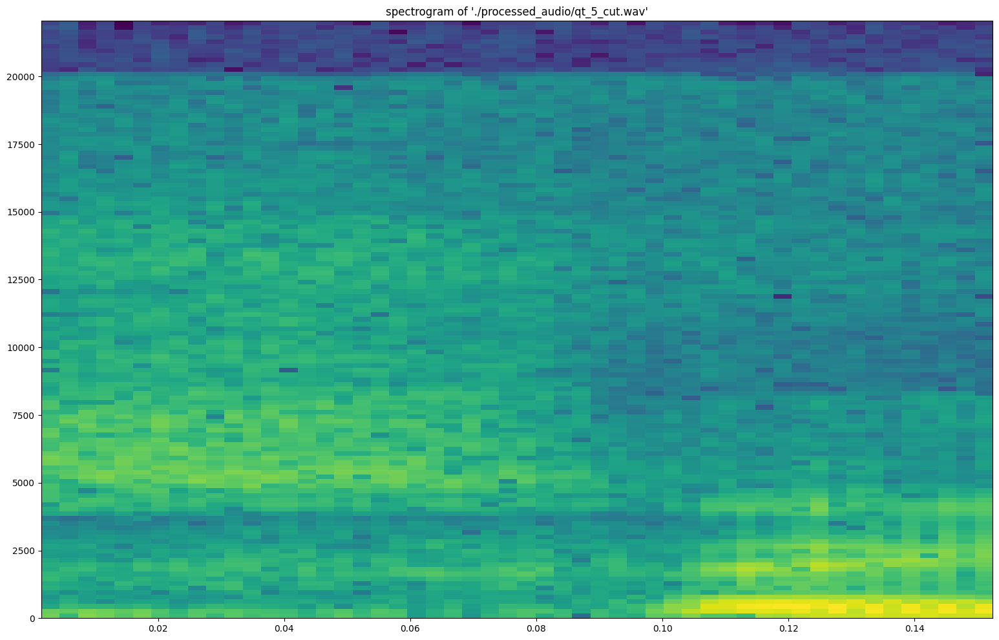

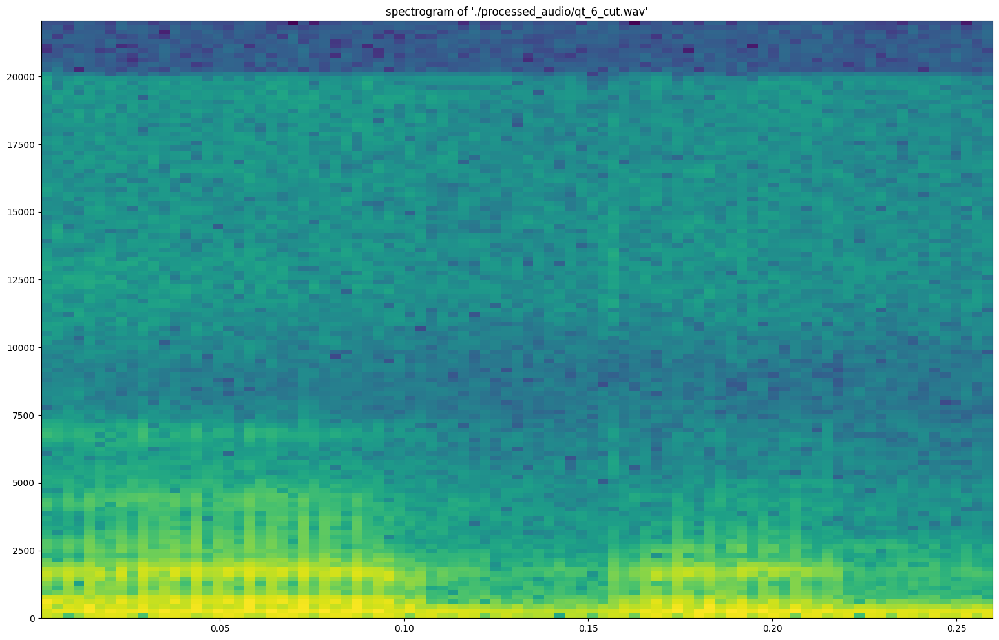

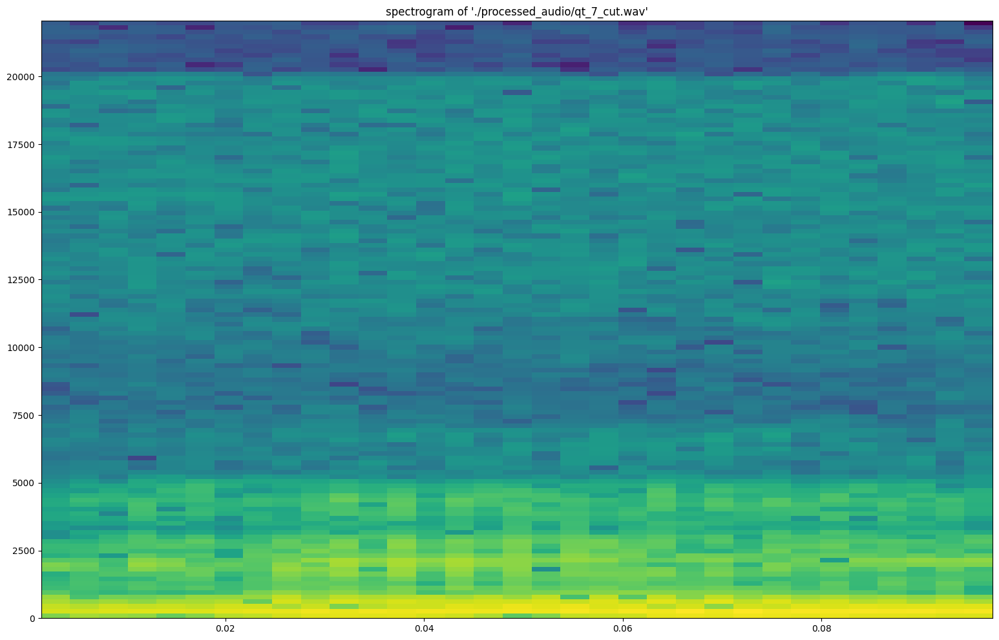

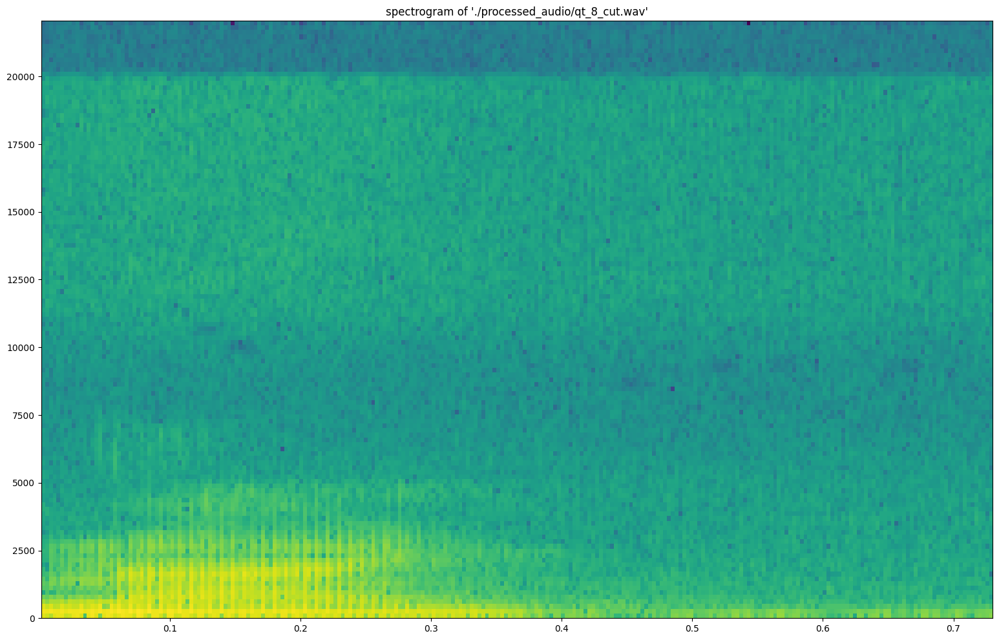

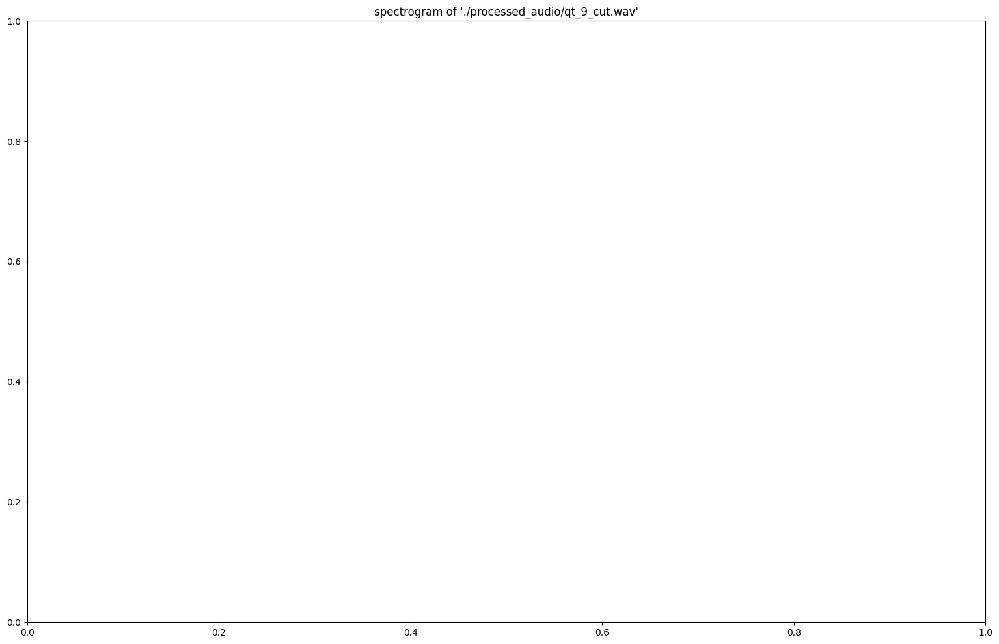

In [23]:
for person in PEOPLE:
    for number in NUMBERS:
        audio_path = PROCESSED_FOLDER + person + "_" + number + "_cut" + AUDIO_FORMAT
        graph_spectrogram(audio_path)